# *Week-1*

In [1]:
!pip install pycaret

  Using cached https://files.pythonhosted.org/packages/f4/cb/64623369f348e9bfb29ff898a57ac7c91ed4921f228e9726546614d63ccb/scikit_learn-0.23.2-cp37-cp37m-manylinux1_x86_64.whl
ERROR: imbalanced-learn 0.8.0 has requirement scikit-learn>=0.24, but you'll have scikit-learn 0.23.2 which is incompatible.
ERROR: dabl 0.2.0 has requirement scikit-learn>=0.24.0, but you'll have scikit-learn 0.23.2 which is incompatible.
  Found existing installation: scikit-learn 0.24.1
    Uninstalling scikit-learn-0.24.1:
      Successfully uninstalled scikit-learn-0.24.1


In [2]:
!pip install pandas-profiling
!pip install dabl
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://files.pythonhosted.org/packages/f3/74/eb899f41d55f957e2591cde5528e75871f817d9fb46d4732423ecaca736d/scikit_learn-0.24.1-cp37-cp37m-manylinux2010_x86_64.whl
ERROR: pycaret 2.3.0 has requirement scikit-learn==0.23.2, but you'll have scikit-learn 0.24.1 which is incompatible.
  Found existing installation: scikit-learn 0.23.2
    Uninstalling scikit-learn-0.23.2:
      Successfully uninstalled scikit-learn-0.23.2
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.12.0-py2.py3-none-any.whl size=243829 sha256=ab71301c9ee62bd8662b8733584cd67b76838ef9a012809dd51b0e4cfa05ac01
  Stored in directory: /tmp/pip-ephem-wheel-cache-xy761cb7/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


In [3]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import dabl
import missingno as msno
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression 
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})

# **Week-1**

In [5]:
df = pd.read_csv("health care diabetes.csv")

In [6]:
df.head() 

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [8]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


#### There is 768 observations of 9 variable. 
- Independent variables are Pregnencies , Glucose, BloodPressure, Insulin, BMI and DiabetesPedigree Function. 
- Age is Outcome Variable. 
- Average Age of Patients are 33.24 with minimum being 21 and maximum 81. 
- Avg. value of independent variables are 
1. Preg = 3.845052
2. Glucose = 120.894531
3. BP = 69.105469
4. ST=20.536458
5. Insulin = 79.799479
6. BMI = 31.992578 
7. DPF = 0.471876 . 


### Exploratory Data Analysis using Pandas Profiling (Generating HTML Report)

In [9]:
design_report = ProfileReport(df)
design_report

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Saving Pandas Profiling Data Analysis Report

In [10]:
design_report.to_file(output_file='data_analysis_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Exploratory Data Analysis using Data Analysis Baseline Library (DABL)

In [11]:
df_clean = dabl.clean(df, verbose=1)
df_clean

Detected feature types:
continuous      7
dirty_float     0
low_card_int    1
categorical     1
date            0
free_string     0
useless         0
dtype: int64


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [12]:
types = dabl.detect_types(df_clean)
types

,continuous,dirty_float,low_card_int,categorical,date,free_string,useless
Pregnancies,False,False,True,False,False,False,False
Glucose,True,False,False,False,False,False,False
BloodPressure,True,False,False,False,False,False,False
SkinThickness,True,False,False,False,False,False,False
Insulin,True,False,False,False,False,False,False
BMI,True,False,False,False,False,False,False
DiabetesPedigreeFunction,True,False,False,False,False,False,False
Age,True,False,False,False,False,False,False
Outcome,False,False,False,True,False,False,False


Target looks like regression


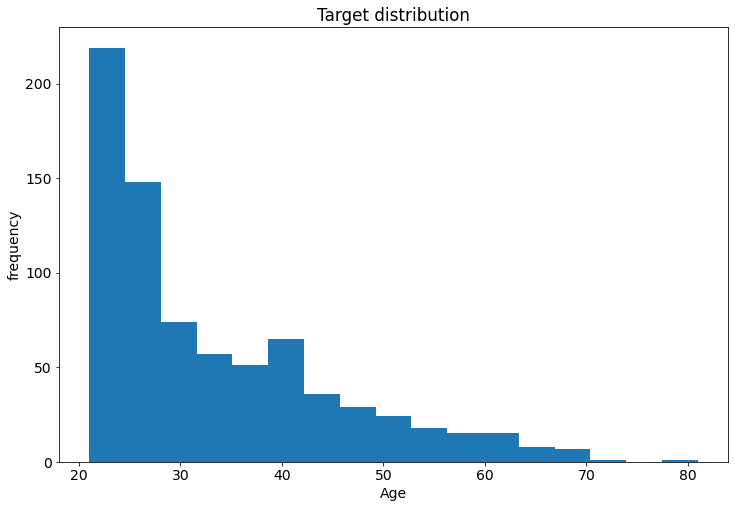

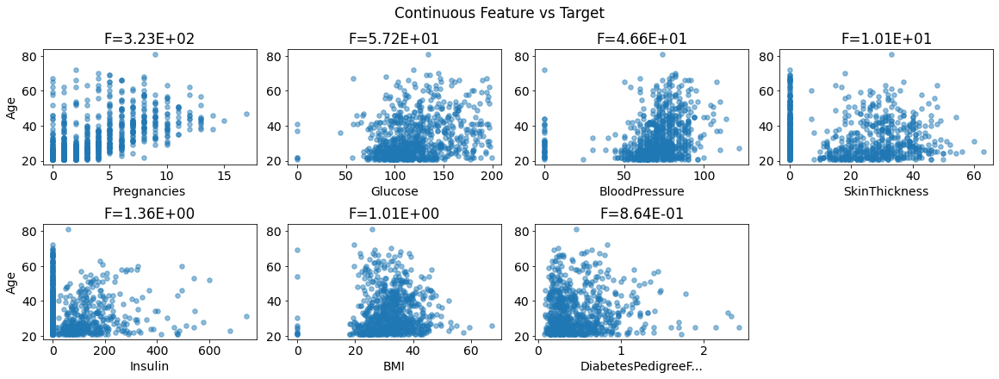

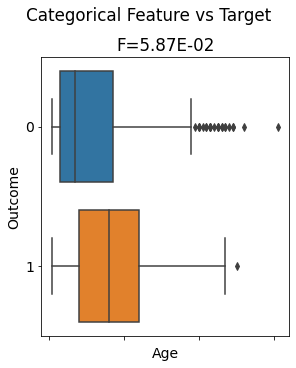

In [13]:
dabl.plot(df, target_col="Age")

Target looks like classification
Linear Discriminant Analysis training set score: 0.737


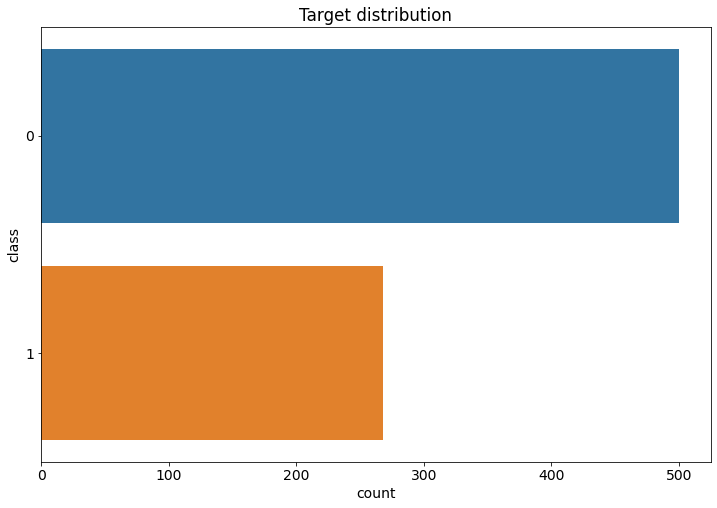

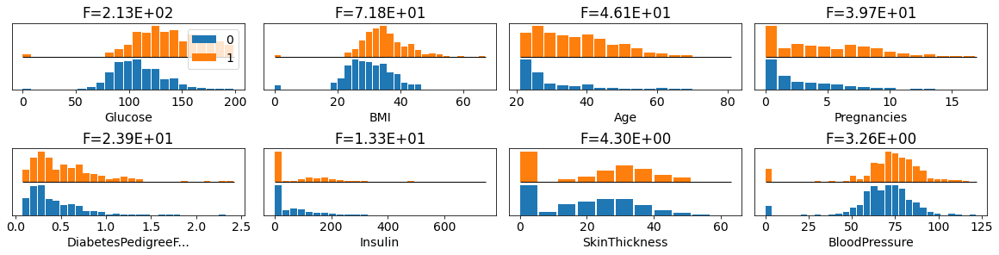

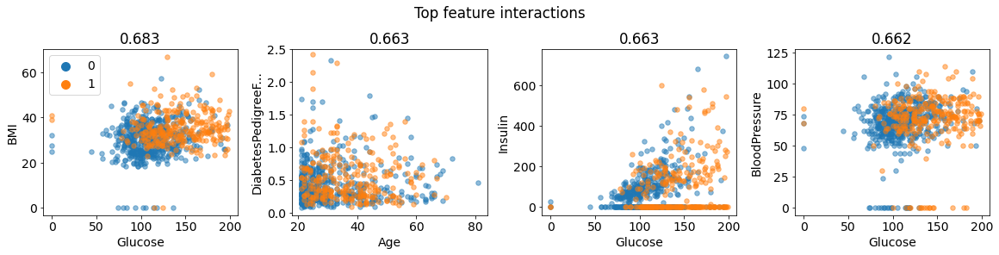

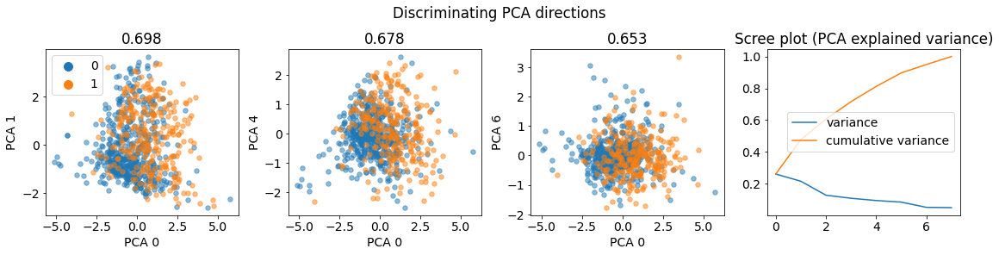

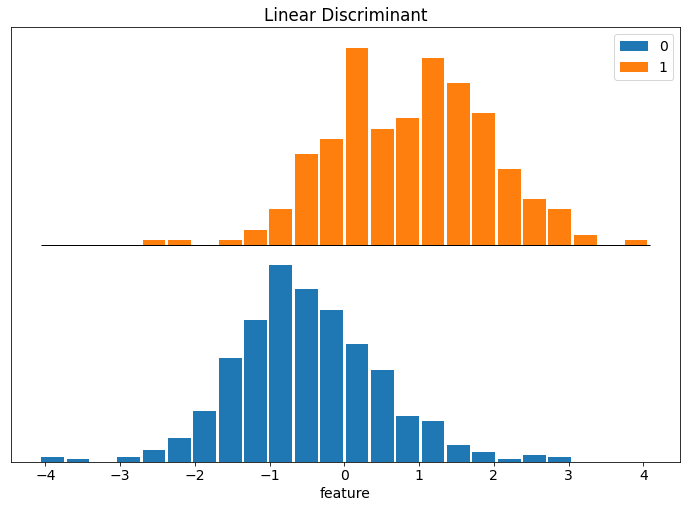

In [14]:
dabl.plot(df, target_col="Outcome")

### Remove warnings from Data Analysis Report from html file.
##### But data analysis report shows zeros values are present in following columns
- 'Pregnancies'
- 'Glucose'
- 'BloodPressure'
- 'SkinThickness'
- 'Insulin'
- 'BMI'
- 'DiabetesPedigreeFunction'

In [15]:
df_new=df

In [16]:
df_new.columns.to_list()

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age',
 'Outcome']

#### Convert the '0' values into np.nan

In [18]:
lst_col=df_new.columns.to_list()
lst_col.remove('Outcome')
for col in lst_col:
  df_new[col] = df_new[col].replace(0,np.nan)

In [19]:
df_new.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1.0,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8.0,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,NaN,137.0,40.0,35.0,168.0,43.1,2.288,33,1


In [20]:
df_new.isnull().sum()

Pregnancies                 111
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [21]:
print("Total Missing Values Count: ",df_new.isnull().sum().sum())

Total Missing Values Count:  763


### Assuming "?" or 'Zero' values are like Missing/NULL values, Handling them to generate more value

#### Replace missing values using KNNImputer

In [22]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df_new=pd.DataFrame(imputer.fit_transform(df_new),columns=df_new.columns)

In [23]:
df_new.head(3)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,169.0,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,58.6,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,25.8,164.6,23.3,0.672,32.0,1.0


In [25]:
df_new.isnull().sum().sum()

0

In [26]:
df_new.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,4.403646,121.596875,72.366146,29.076562,152.991406,32.446328,0.471876,33.240885,0.348958
std,3.036430,30.497539,12.179449,9.406806,98.168438,6.884144,0.331329,11.760232,0.476951
min,1.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,2.000000,99.000000,64.000000,23.000000,87.450000,27.500000,0.243750,24.000000,0.000000
50%,4.000000,117.000000,72.000000,29.000000,134.600000,32.250000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,34.850000,190.000000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


### Exploratory Data Analysis **after replace '0' values** using Pandas Profiling (Generating HTML Report)

In [27]:
design_report1 = ProfileReport(df_new)
design_report1

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Saving Pandas Profiling Data Analysis Report

In [28]:
design_report1.to_file(output_file='data_analysis_report_after.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Exploratory Data Analysis using Data Analysis Baseline Library (DABL)

In [29]:
df_clean = dabl.clean(df_new, verbose=1)
df_clean

Detected feature types:
continuous      8
dirty_float     0
low_card_int    0
categorical     1
date            0
free_string     0
useless         0
dtype: int64


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,169.0,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,58.6,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,25.8,164.6,23.3,0.672,32.0,1.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0
4,6.2,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1.0
...,...,...,...,...,...,...,...,...,...
763,10.0,101.0,76.0,48.0,180.0,32.9,0.171,63.0,0.0
764,2.0,122.0,70.0,27.0,165.0,36.8,0.340,27.0,0.0
765,5.0,121.0,72.0,23.0,112.0,26.2,0.245,30.0,0.0
766,1.0,126.0,60.0,35.2,134.2,30.1,0.349,47.0,1.0


In [30]:
types = dabl.detect_types(df_clean)
types

,continuous,dirty_float,low_card_int,categorical,date,free_string,useless
Pregnancies,True,False,False,False,False,False,False
Glucose,True,False,False,False,False,False,False
BloodPressure,True,False,False,False,False,False,False
SkinThickness,True,False,False,False,False,False,False
Insulin,True,False,False,False,False,False,False
BMI,True,False,False,False,False,False,False
DiabetesPedigreeFunction,True,False,False,False,False,False,False
Age,True,False,False,False,False,False,False
Outcome,False,False,False,True,False,False,False


In [74]:
df_clean.to_csv('after_week_1.csv',index=False)

Target looks like regression


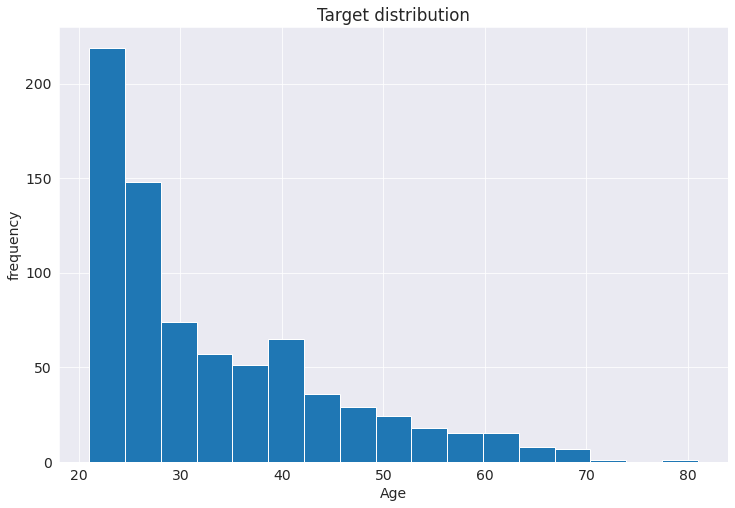

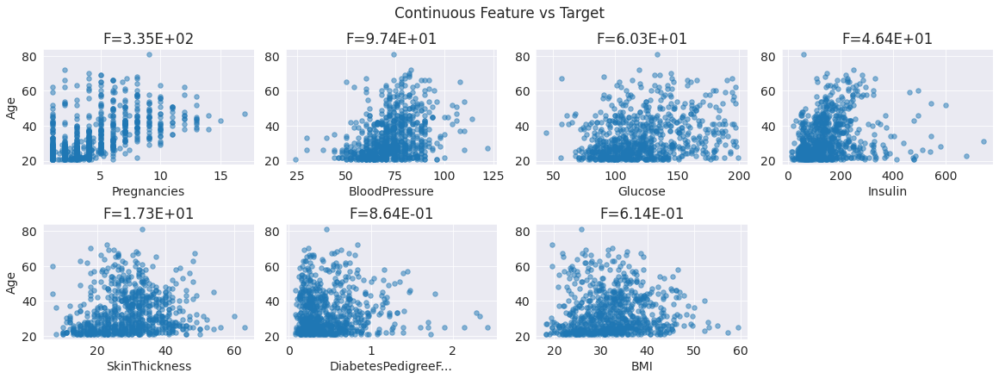

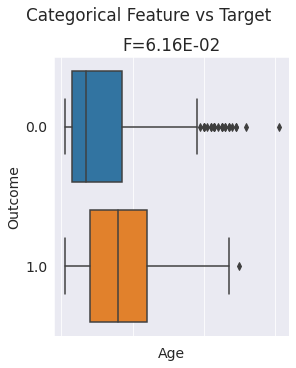

In [75]:
dabl.plot(df_clean, target_col="Age")

Target looks like classification
Linear Discriminant Analysis training set score: 0.728


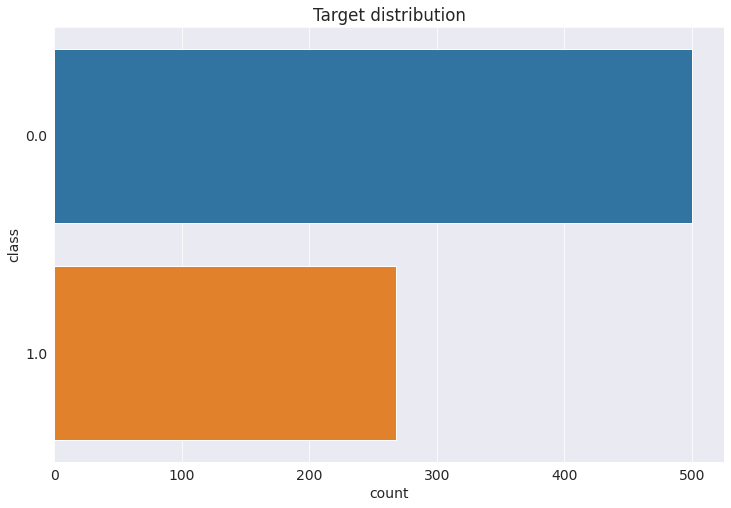

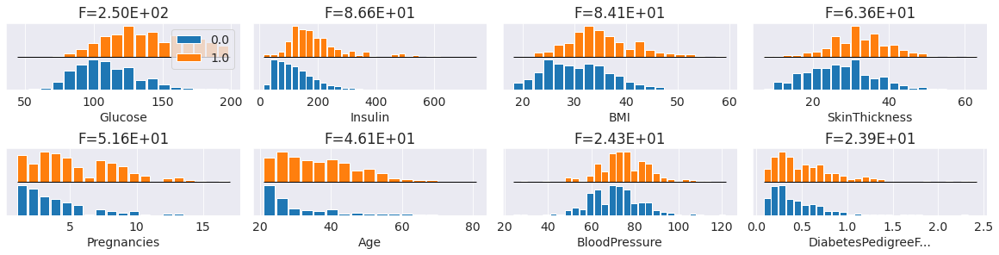

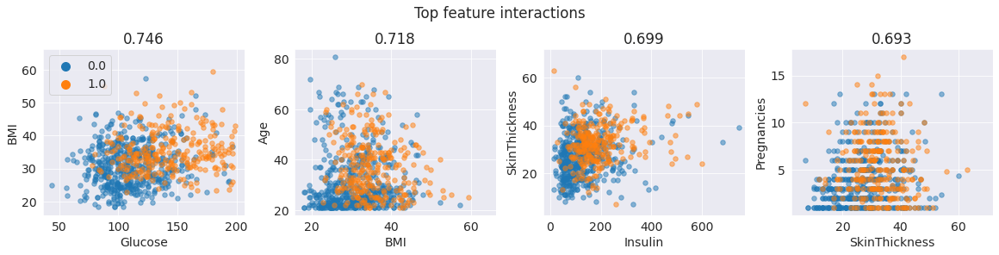

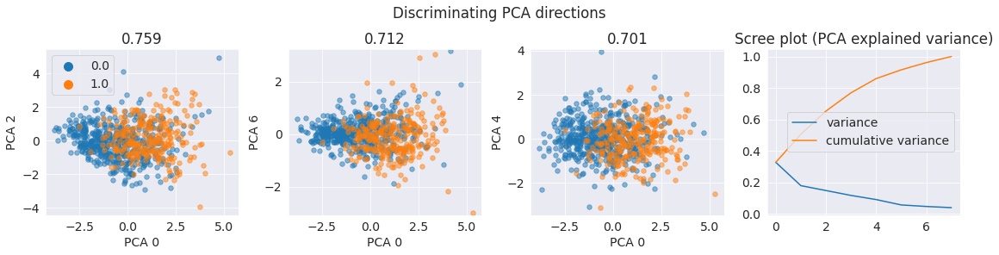

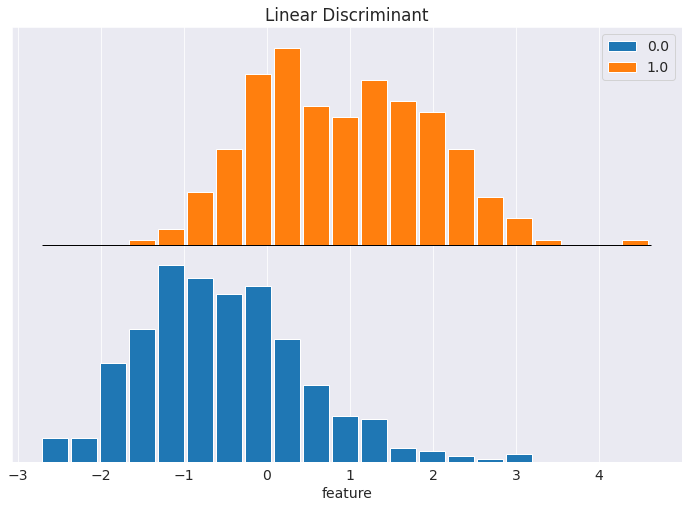

In [76]:
dabl.plot(df_clean, target_col="Outcome")

# *Week-2*

Project Task: Week 2
Data Exploration:

1. Check the balance of the data by plotting the count of outcomes by their value. Describe your findings and plan future course of action.

2. Create scatter charts between the pair of variables to understand the relationships. Describe your findings.

3. Perform correlation analysis. Visually explore it using a heat map.

## Check the balance of the data by plotting the count of outcomes by their value. 

In [79]:
df_new=df_clean

Count of class is:
 0.0    500
1.0    268
Name: Outcome, dtype: int64


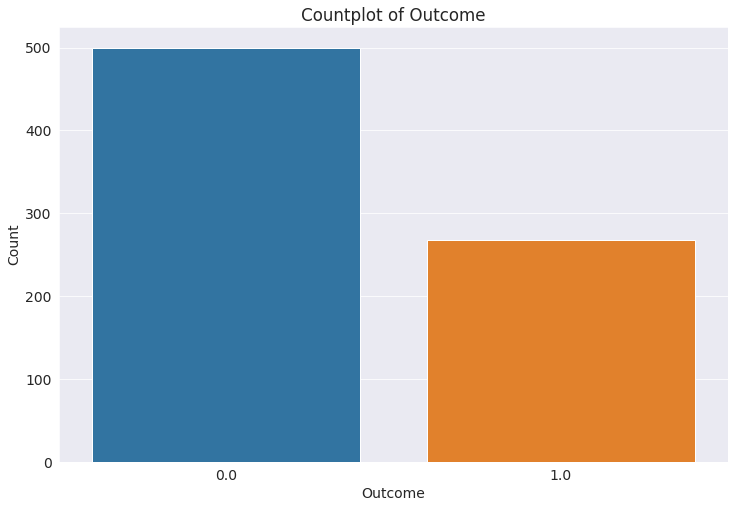

In [80]:
sns.set_style()
sns.countplot(df_new['Outcome'])
plt.title("Countplot of Outcome")
plt.xlabel('Outcome')
plt.ylabel("Count")
print("Count of class is:\n",df_new['Outcome'].value_counts())

### Obersevation from above 
- I can see that both class is balanced so we need not to perform any sampling method to maintain the balance between both classes. 
- Therefore I will be directly using this data in training and testing purpose without performing any sampling method. 
- Meanwhile during Model Validation , I will also need not worry abour ROC Curve because data is not imbalanced, but as this is a medical data so I will be using ROC curve to make sure TYPE 2 ERROR will not be there.

## Create scatter charts between the pair of variables to understand the relationships. Describe your findings.


Text(0.5, 1.0, 'Scatter plot between variables')

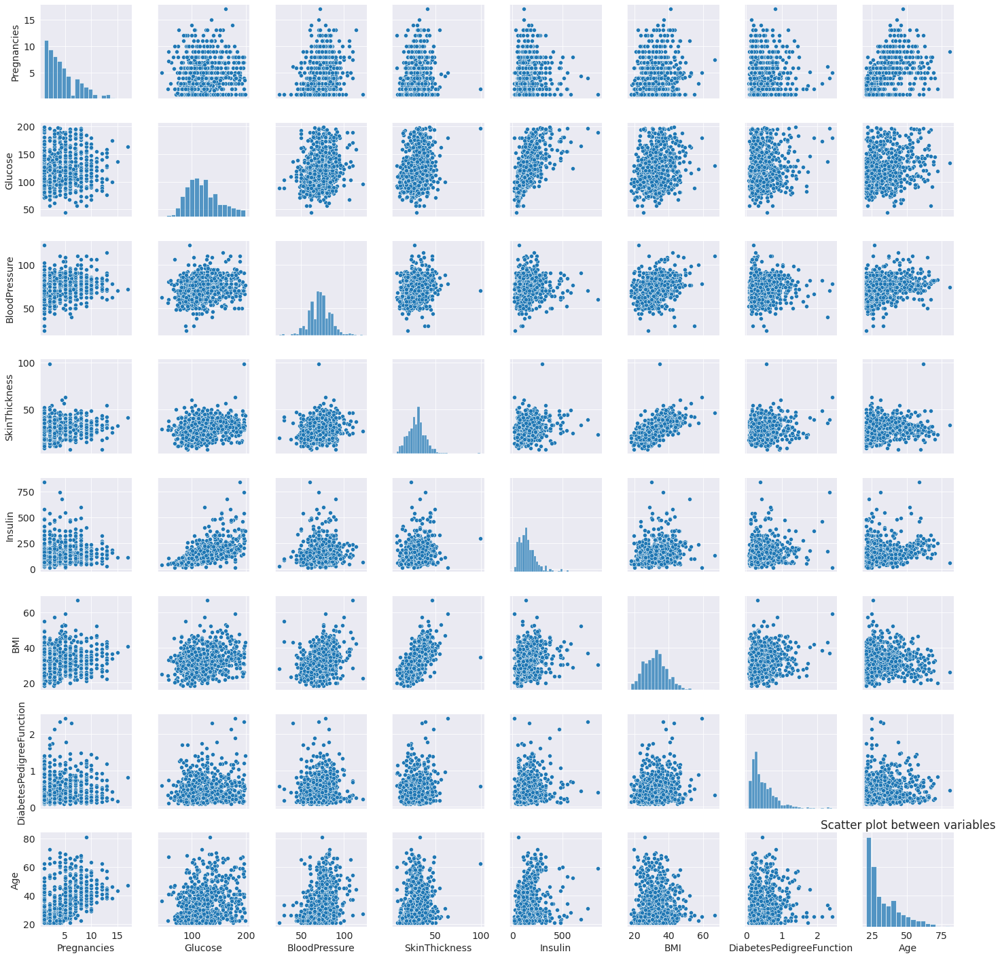

In [81]:
sns.pairplot(df_new)
plt.title('Scatter plot between variables')

In [82]:
df_new.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Pregnancies,1.000000,0.161341,0.275796,0.154499,0.087327,0.116568,0.006071,0.551389
Glucose,0.161341,1.000000,0.232323,0.247234,0.627370,0.236803,0.139232,0.270147
BloodPressure,0.275796,0.232323,1.000000,0.228965,0.135680,0.291449,0.004074,0.335927
SkinThickness,0.154499,0.247234,0.228965,1.000000,0.245025,0.639515,0.112569,0.148464
Insulin,0.087327,0.627370,0.135680,0.245025,1.000000,0.249367,0.137555,0.239106
BMI,0.116568,0.236803,0.291449,0.639515,0.249367,1.000000,0.152467,0.028307
DiabetesPedigreeFunction,0.006071,0.139232,0.004074,0.112569,0.137555,0.152467,1.000000,0.033561
Age,0.551389,0.270147,0.335927,0.148464,0.239106,0.028307,0.033561,1.000000


1. We can clearly see that Glucose and BMI has good impact on outcome. 
2. There is a strong positive correlation between 
  - BMI and Skinthickness 
  - Pregnancies and Age

## Perform correlation analysis. Visually explore it using a heat map.

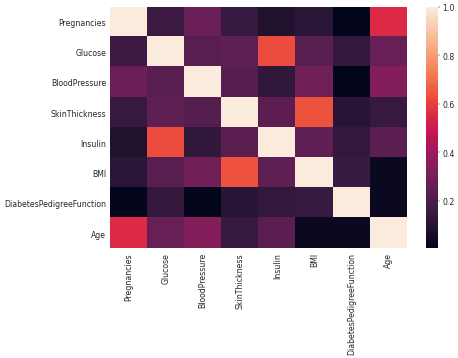

In [84]:
plt.figure(dpi=40)
sns.heatmap(df_new.corr())

**Project Task: Week 3**
# Data Modeling:

1. Devise strategies for model building. It is important to decide the right validation framework. Express your thought process.

2. Apply an appropriate classification algorithm to build a model. Compare various models with the results from KNN algorithm.

# Feature Engineering
### Perform Label Encoding to Categorical Features

In [85]:
df_new.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,169.0,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,58.6,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,25.8,164.6,23.3,0.672,32.0,1.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0
4,6.2,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1.0


In [100]:
categorical_df = df_new.apply(LabelEncoder().fit_transform)

In [101]:
categorical_df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,24,90,29,88,277,130,350,29,1
1,0,22,21,59,47,61,196,10,0
2,32,125,17,43,265,29,368,11,1
3,0,27,21,34,117,77,53,0,0
4,25,79,3,88,275,219,514,12,1


In [103]:
df_lbl=categorical_df.copy()
df_lbl.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

### Perform Feature Scaling using Standard Scalar Technique

In [104]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']
autoscaler = StandardScaler()

In [105]:
df_lbl[features] = autoscaler.fit_transform(df_lbl[features])
df_lbl.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.744368,0.893813,-0.132657,0.876010,0.545461,0.187413,0.835913,1.432892,1
1,-1.291571,-1.260048,-0.663977,-0.004825,-1.299303,-0.920876,-0.241471,-0.190333,0
2,1.423015,2.002418,-0.929637,-0.490803,0.449212,-1.434866,0.961841,-0.104900,1
3,-1.291571,-1.101676,-0.663977,-0.764166,-0.737853,-0.663882,-1.241900,-1.044662,0
4,0.829199,0.545394,-1.859447,0.876010,0.529419,1.616945,1.983257,-0.019467,1


In [111]:
norm=lambda a:(a-min(a))/(max(a)-min(a))

In [112]:
df_norm=df_lbl.iloc[:,:-1]

In [113]:
df_normalized=df_norm.apply(norm)

In [114]:
df_normalized.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.600,0.647482,0.439394,0.692913,0.604803,0.505837,0.678295,0.568627
1,0.000,0.158273,0.318182,0.464567,0.102620,0.237354,0.379845,0.196078
2,0.800,0.899281,0.257576,0.338583,0.578603,0.112840,0.713178,0.215686
3,0.000,0.194245,0.318182,0.267717,0.255459,0.299611,0.102713,0.000000
4,0.625,0.568345,0.045455,0.692913,0.600437,0.852140,0.996124,0.235294


In [118]:
df_outcome

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [119]:
df11=pd.concat([df_normalized,df_outcome],axis=1)

In [120]:
df11.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.600,0.647482,0.439394,0.692913,0.604803,0.505837,0.678295,0.568627,1
1,0.000,0.158273,0.318182,0.464567,0.102620,0.237354,0.379845,0.196078,0
2,0.800,0.899281,0.257576,0.338583,0.578603,0.112840,0.713178,0.215686,1
3,0.000,0.194245,0.318182,0.267717,0.255459,0.299611,0.102713,0.000000,0
4,0.625,0.568345,0.045455,0.692913,0.600437,0.852140,0.996124,0.235294,1


In [109]:
df_lbl=categorical_df.copy()

In [115]:
df_lbl.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,24,90,29,88,277,130,350,29,1
1,0,22,21,59,47,61,196,10,0
2,32,125,17,43,265,29,368,11,1
3,0,27,21,34,117,77,53,0,0
4,25,79,3,88,275,219,514,12,1


# Machine Learning Model Building Approaches
## 1. Baseline Model using DABL SimpleClassifier()

In [116]:
ec = dabl.SimpleClassifier(random_state=0).fit(df_lbl, target_col="Outcome") 
ec

Running DummyClassifier()
accuracy: 0.651 average_precision: 0.349 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.394
=== new best DummyClassifier() (using recall_macro):
accuracy: 0.651 average_precision: 0.349 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.394

Running GaussianNB()
accuracy: 0.376 average_precision: 0.515 roc_auc: 0.714 recall_macro: 0.506 f1_macro: 0.323
=== new best GaussianNB() (using recall_macro):
accuracy: 0.376 average_precision: 0.515 roc_auc: 0.714 recall_macro: 0.506 f1_macro: 0.323

Running MultinomialNB()
accuracy: 0.661 average_precision: 0.508 roc_auc: 0.678 recall_macro: 0.567 f1_macro: 0.557
=== new best MultinomialNB() (using recall_macro):
accuracy: 0.661 average_precision: 0.508 roc_auc: 0.678 recall_macro: 0.567 f1_macro: 0.557

Running DecisionTreeClassifier(class_weight='balanced', max_depth=1)
accuracy: 0.711 average_precision: 0.506 roc_auc: 0.706 recall_macro: 0.706 f1_macro: 0.694
=== new best DecisionTreeClassifier(class_weight='balanced', 

SimpleClassifier(random_state=0)

In [121]:
ec = dabl.SimpleClassifier(random_state=0).fit(df11, target_col="Outcome") 
ec

Running DummyClassifier()
accuracy: 0.651 average_precision: 0.349 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.394
=== new best DummyClassifier() (using recall_macro):
accuracy: 0.651 average_precision: 0.349 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.394

Running GaussianNB()
accuracy: 0.750 average_precision: 0.711 roc_auc: 0.833 recall_macro: 0.735 f1_macro: 0.730
=== new best GaussianNB() (using recall_macro):
accuracy: 0.750 average_precision: 0.711 roc_auc: 0.833 recall_macro: 0.735 f1_macro: 0.730

Running MultinomialNB()
accuracy: 0.651 average_precision: 0.504 roc_auc: 0.649 recall_macro: 0.500 f1_macro: 0.394
Running DecisionTreeClassifier(class_weight='balanced', max_depth=1)
accuracy: 0.711 average_precision: 0.506 roc_auc: 0.706 recall_macro: 0.706 f1_macro: 0.694
Running DecisionTreeClassifier(class_weight='balanced', max_depth=5)
accuracy: 0.715 average_precision: 0.612 roc_auc: 0.762 recall_macro: 0.719 f1_macro: 0.702
Running DecisionTreeClassifier(class_weight=

SimpleClassifier(random_state=0)


### Feature Importance using DABL on Best Model: Logistic Regression



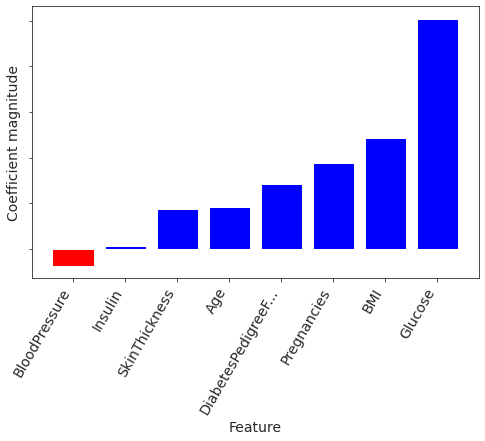

In [51]:
dabl.explain(ec) 

## 2. Ensemble Learning Model: Random Forest
Training Data: 80%
Test Data: 20%

In [56]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
RSEED = 50
target = np.array(df_new.pop('Outcome'))
# 20% examples in test data
train, test, train_labels, test_labels = train_test_split(df_new,
                                         target, 
                                         test_size = 0.2, 
                                         random_state = RSEED)
# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=100,random_state=RSEED, n_jobs=-1, verbose = 1)
# Fit on training data
model.fit(train, train_labels)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished


RandomForestClassifier(n_jobs=-1, random_state=50, verbose=1)

### Statistics about the trees in Random Forest

In [59]:
n_nodes = []
max_depths = []

# Stats about the trees in random forest
for ind_tree in model.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    
print(f'Average number of nodes {int(np.mean(n_nodes))}')
print(f'Average maximum depth {int(np.mean(max_depths))}')

Average number of nodes 196
Average maximum depth 14


In [60]:
# Training predictions (to demonstrate overfitting)
train_rf_predictions = model.predict(train)
train_rf_probs = model.predict_proba(train)[:, 1]

# Testing predictions (to determine performance)
rf_predictions = model.predict(test)
rf_probs = model.predict_proba(test)[:, 1]

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished


### Feature Importances given by Random Forest

                    Feature  Importance
1                   Glucose    0.232219
5                       BMI    0.142833
4                   Insulin    0.142239
7                       Age    0.116882
6  DiabetesPedigreeFunction    0.111370
3             SkinThickness    0.106489
0               Pregnancies    0.074990
2             BloodPressure    0.072978


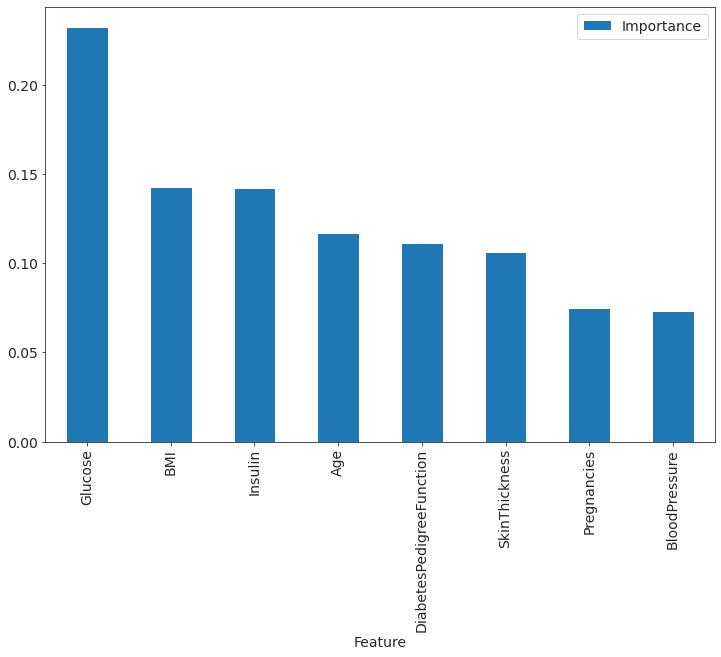

In [61]:
# Extract feature importances
features = pd.DataFrame()
features['Feature'] = train.columns
features['Importance'] = model.feature_importances_
features.sort_values(by=['Importance'], ascending=False, inplace=True)
print(features)
features.set_index('Feature', inplace=True)
features.plot(kind='bar')

## Model Evaluation using Various Metrics
### ROC Curve

In [62]:
!pip install plot-metric

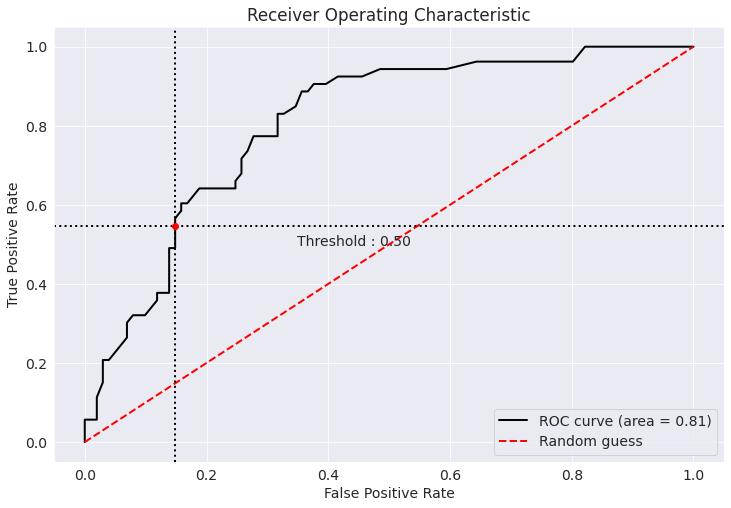

In [63]:
from plot_metric.functions import BinaryClassification
# Visualisation with plot_metric
bc = BinaryClassification(test_labels, rf_probs, labels=["Class 1", "Class 2"])

# Figures
plt.figure()
bc.plot_roc_curve()
plt.show()


In [32]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
RSEED = 70
target = np.array(df_new.pop('Age'))
train, test, train_labels, test_labels = train_test_split(df_new,target,test_size = 0.2)
# Create the model with 100 trees

In [33]:
df_new.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Outcome'],
      dtype='object')

Depth: 36
Number of leaves: 591


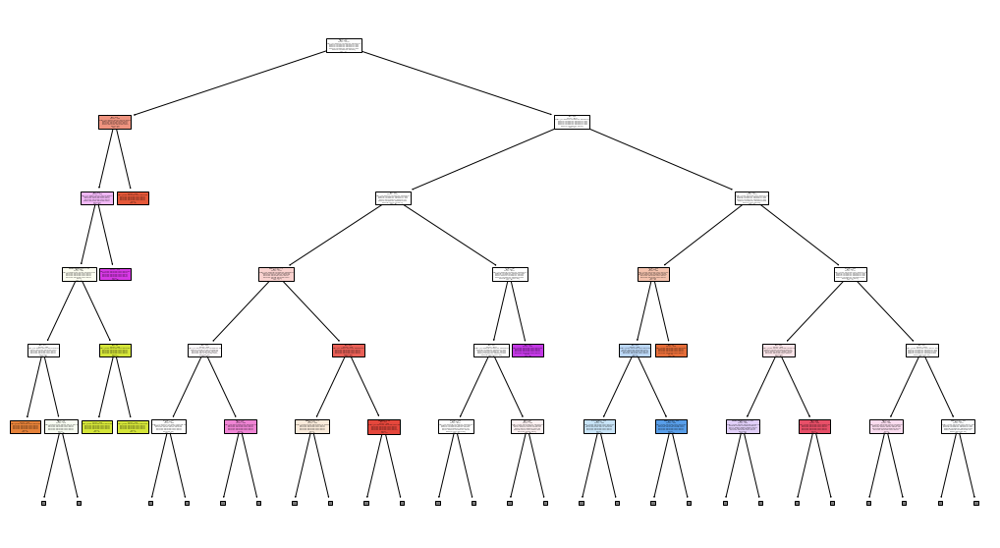

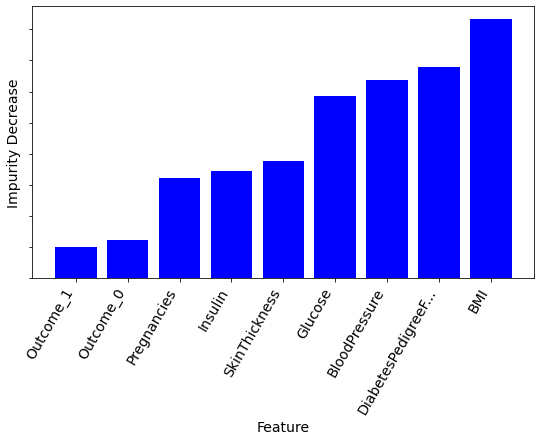

In [34]:
dabl.explain(ec) 

## After feature engneering

In [35]:
df_feature=df_clean

In [103]:
main_df=df_clean

In [36]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction']
autoscaler = StandardScaler()
df_feature[features] = autoscaler.fit_transform(df_feature[features])
df_feature.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.526076,0.866310,-0.030082,0.630107,0.163179,0.167693,0.468492,50.0,1.0
1,-1.121667,-1.200776,-0.523036,-0.008144,-0.962152,-0.849799,-0.365061,31.0,0.0
2,1.185174,2.014692,-0.687354,-0.348545,0.118329,-1.329474,0.604397,32.0,1.0
3,-1.121667,-1.069533,-0.523036,-0.646396,-0.601312,-0.631765,-0.920763,21.0,0.0
4,0.591986,0.505390,-2.659171,0.630107,0.152986,1.548575,5.484909,33.0,1.0


In [119]:
norm=lambda a:(a-min(a))/(max(a)-min(a))

In [120]:
df_norm=df_feature.iloc[:,:-1]

In [126]:
y=df.iloc[:,-1].values
y

array([1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,

In [121]:
df_normalized=df_norm.apply(norm)

In [122]:
df_normalized.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.3125,0.670968,0.489796,0.304348,0.186298,0.314928,0.234415,0.483333
1,0.0000,0.264516,0.428571,0.239130,0.053606,0.171779,0.116567,0.166667
2,0.4375,0.896774,0.408163,0.204348,0.181010,0.104294,0.253629,0.183333
3,0.0000,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000
4,0.3250,0.600000,0.163265,0.304348,0.185096,0.509202,0.943638,0.200000


In [109]:
ec = dabl.SimpleClassifier(random_state=0).fit(df_feature.values, target_col="Outcome") 
ec

Running DummyClassifier()
accuracy: 0.651 average_precision: 0.349 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.394
=== new best DummyClassifier() (using recall_macro):
accuracy: 0.651 average_precision: 0.349 roc_auc: 0.500 recall_macro: 0.500 f1_macro: 0.394

Running GaussianNB()
accuracy: 0.750 average_precision: 0.693 roc_auc: 0.825 recall_macro: 0.722 f1_macro: 0.723
=== new best GaussianNB() (using recall_macro):
accuracy: 0.750 average_precision: 0.693 roc_auc: 0.825 recall_macro: 0.722 f1_macro: 0.723

Running MultinomialNB()
accuracy: 0.651 average_precision: 0.538 roc_auc: 0.710 recall_macro: 0.500 f1_macro: 0.394
Running DecisionTreeClassifier(class_weight='balanced', max_depth=1)
accuracy: 0.711 average_precision: 0.506 roc_auc: 0.706 recall_macro: 0.706 f1_macro: 0.694
Running DecisionTreeClassifier(class_weight='balanced', max_depth=5)
accuracy: 0.715 average_precision: 0.610 roc_auc: 0.761 recall_macro: 0.719 f1_macro: 0.702
Running DecisionTreeClassifier(class_weight=

SimpleClassifier(random_state=0, refit=True, shuffle=True, type_hints=None,
                 verbose=1)

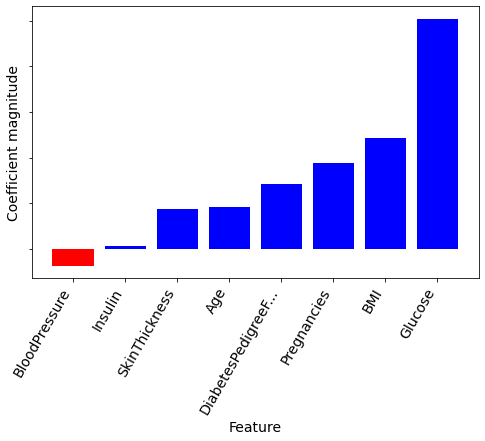

In [110]:
dabl.explain(ec) 

## 2. Ensemble Learning Model: Random Forest
Training Data: 80%
Test Data: 20%

In [39]:
df_en=df_clean

In [40]:
df_en.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [41]:
x=df.iloc[:,:-1].values
y=df.iloc[:,-1].values

In [125]:
y

array([1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,

In [42]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=0)

In [43]:
from sklearn.preprocessing import StandardScaler

In [44]:
Scale=StandardScaler()
x_train_std=Scale.fit_transform(x_train)
x_test_std=Scale.transform(x_test)

In [45]:
norm=lambda a:(a-min(a))/(max(a)-min(a))

In [46]:
df_norm=df.iloc[:,:-1]

In [47]:
df_normalized=df_norm.apply(norm)

In [127]:
x_train_norm,x_test_norm,y_train_norm,y_test_norm=train_test_split(df_normalized.values,df.iloc[:,-1].values,test_size=0.20,random_state=0)

### Statistics about the trees in Random Forest

In [49]:
n_nodes = []
max_depths = []

# Stats about the trees in random forest
for ind_tree in model.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    
print(f'Average number of nodes {int(np.mean(n_nodes))}')
print(f'Average maximum depth {int(np.mean(max_depths))}')

NameError: ignored

In [ ]:
# Training predictions (to demonstrate overfitting)
train_rf_predictions = model.predict(train)
train_rf_probs = model.predict_proba(train)[:, 1]

# Testing predictions (to determine performance)
rf_predictions = model.predict(test)
rf_probs = model.predict_proba(test)[:, 1]

#4. Machine Learning Model Comparison using PyCaret for further improvement

In [50]:
from pycaret import classification

In [66]:
df11=pd.read_csv("/content/health care diabetes.csv")
df11.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [67]:
lst_col=df11.columns.to_list()
lst_col.remove('Outcome')
for col in lst_col:
  df_new[col] = df11[col].replace(0,np.nan)

In [68]:
df11.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [70]:
from sklearn.impute import SimpleImputer

In [89]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values= np.nan, strategy='mean')

In [90]:
data=df11
print("Original Data : \n", data) 
# Fitting the data to the imputer object 
imputer = imputer.fit(data) 
  
# Imputing the data      
data = imputer.transform(data) 
  
print("Imputed Data : \n", data)

Original Data : 
      Pregnancies  Glucose  ...  Age  Outcome
0              6      148  ...   50        1
1              1       85  ...   31        0
2              8      183  ...   32        1
3              1       89  ...   21        0
4              0      137  ...   33        1
..           ...      ...  ...  ...      ...
763           10      101  ...   63        0
764            2      122  ...   27        0
765            5      121  ...   30        0
766            1      126  ...   47        1
767            1       93  ...   23        0

[768 rows x 9 columns]
Imputed Data : 
 [[  6.    148.     72.    ...   0.627  50.      1.   ]
 [  1.     85.     66.    ...   0.351  31.      0.   ]
 [  8.    183.     64.    ...   0.672  32.      1.   ]
 ...
 [  5.    121.     72.    ...   0.245  30.      0.   ]
 [  1.    126.     60.    ...   0.349  47.      1.   ]
 [  1.     93.     70.    ...   0.315  23.      0.   ]]


In [96]:
main_df=df11
df11.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [104]:
main_df.isnull().sum().sum()

0

In [105]:
types = dabl.detect_types(main_df)
types

,continuous,dirty_float,low_card_int,categorical,date,free_string,useless
Pregnancies,True,False,False,False,False,False,False
Glucose,True,False,False,False,False,False,False
BloodPressure,True,False,False,False,False,False,False
SkinThickness,True,False,False,False,False,False,False
Insulin,True,False,False,False,False,False,False
BMI,True,False,False,False,False,False,False
DiabetesPedigreeFunction,True,False,False,False,False,False,False
Age,True,False,False,False,False,False,False
Outcome,False,False,False,True,False,False,False


In [106]:
main_df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [128]:
classification_setup = classification.setup(data=main_df, target='Outcome')

,Description,Value
0,session_id,350
1,Target,Outcome
2,Target Type,Binary
3,Label Encoded,"0.0: 0, 1.0: 1"
4,Original Data,"(768, 9)"
5,Missing Values,False
6,Numeric Features,8
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


AttributeError: ignored

In [108]:
classification.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.1153,0.0,0.0587,0.0593,0.0684,0.0491,0.0519,0.027
lr,Logistic Regression,0.1136,0.0,0.0617,0.0758,0.0828,0.0621,0.0635,0.381
et,Extra Trees Classifier,0.1136,0.0,0.0703,0.0914,0.0951,0.0694,0.0704,0.516
lda,Linear Discriminant Analysis,0.1116,0.0,0.0625,0.0646,0.0771,0.0615,0.0630,0.022
rf,Random Forest Classifier,0.1100,0.0,0.0708,0.0909,0.0933,0.0637,0.0647,0.596
lightgbm,Light Gradient Boosting Machine,0.1063,0.0,0.0640,0.0922,0.0907,0.0609,0.0617,1.794
knn,K Neighbors Classifier,0.0969,0.0,0.0475,0.0683,0.0740,0.0416,0.0426,0.116
ada,Ada Boost Classifier,0.0967,0.0,0.0503,0.0260,0.0329,0.0417,0.0521,0.171
gbc,Gradient Boosting Classifier,0.0894,0.0,0.0406,0.0598,0.0676,0.0416,0.0423,8.001
nb,Naive Bayes,0.0746,0.0,0.0370,0.0843,0.0691,0.0417,0.0443,0.025


RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=957, solver='auto',
                tol=0.001)

#Feature Importances given by Random Forest

In [ ]:
# Extract feature importances
features = pd.DataFrame()
features['Feature'] = train.columns
features['Importance'] = model.feature_importances_
features.sort_values(by=['Importance'], ascending=False, inplace=True)
print(features) 
features.set_index('Feature', inplace=True)
features.plot(kind='bar')

## Model Evaluation using Various Metrics
### ROC Curve

In [ ]:
!pip install plot-metric